# Introduction

- this notebook tries to do face recognition using a siamese network
- While the true positive rate is at 100%, i.e. every match is classified as a match, the true negative rate is only at around 70%
- Any help tackling this problem is aprreciated
- Feel free to add comments 
- I have trained on a small subset of the faces in order to minimize training time
- If you want to train on more faces, you can adjust the subset size. Currently I am using 10%

In [1]:
import os 
import glob
import tarfile
import shutil
import random

import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as tt
from torchvision.utils import make_grid
import torch.nn as nn
import torch.nn.functional as F
import torchinfo

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

import imageio

from sklearn.metrics import f1_score, confusion_matrix, classification_report

# 1. Data loading and preprocessing

In [2]:
import os

# Listar archivos en el directorio
directorio_base = "../dataset/lfw_funneled/"
archivos = os.listdir(directorio_base)
print("Archivos en el directorio:", archivos)


Archivos en el directorio: ['John_Allen_Muhammad', 'Vicente_Fernandez', 'George_HW_Bush', 'Jesse_Jackson', 'Rubens_Barrichello', 'Richard_Gephardt', 'Claudia_Pechstein', 'Scott_McClellan', 'Habib_Rizieq', 'Richard_Virenque', 'Scott_Peterson', 'Bill_McBride', 'Gerhard_Schroeder', 'Paul_Burrell', 'Tom_Harkin', 'Ann_Veneman', 'Sergio_Vieira_De_Mello', 'John_Ashcroft', 'Sourav_Ganguly', 'George_W_Bush', 'Maria_Soledad_Alvear_Valenzuela', 'Li_Zhaoxing', 'Jeong_Se-hyun', 'Sharon_Stone', 'Edward_Lu', 'Julie_Gerberding', 'Gordon_Brown', 'Naomi_Watts', 'Norm_Coleman', 'Tom_Ridge', 'Jeb_Bush', 'Norah_Jones', 'James_Blake', 'Mohammed_Al-Douri', 'Kate_Hudson', 'Ralf_Schumacher', 'Prince_Charles', 'Hillary_Clinton', 'Woody_Allen', 'Frank_Solich', 'pairs_04.txt', 'Joseph_Biden', 'Hitomi_Soga', 'Lucio_Gutierrez', 'Lleyton_Hewitt', 'Eduard_Shevardnadze', 'Ciro_Gomes', 'pairs.txt', 'Binyamin_Ben-Eliezer', 'Ray_Romano', 'John_Stockton', 'Muhammad_Ali', 'Arnoldo_Aleman', 'Gene_Robinson', 'Mohammad_Khatam

In [3]:
# Ejemplo con ruta absoluta
pairs_train_path = "../dataset/pairsDevTrain.txt"
pairs_test_path = "../dataset/pairsDevTest.txt"

with open(pairs_train_path, "r") as f:
    pairs_train = f.read()

with open(pairs_test_path, "r") as f:
    pairs_test = f.read()


In [4]:
# only keep images with more than 5 samples for training
path =  "../dataset/lfw_funneled"

# find only subdirectories
people = glob.glob(path+"/*/")

counter = 0

# delete all directories with less than 5 images
for p in people:
    if len(os.listdir(p)) < 5:
        shutil.rmtree(p)
        counter += 1

# reset people
print(f"{counter} of {len(people)} directories had to be removed because of too few samples!")
people = glob.glob(path+"/*/")

0 of 423 directories had to be removed because of too few samples!


### There are too many images to be stored in an tensor and to train the model. Even though it would be technically possible with better computing power, I will take a subset of the 901 faces too use as training and test data. If desired, this step can be skipped and the model can be trained on the whole dataset!

In [5]:
# take subset of all faces
random.seed(1234)
people = random.sample(people, int(0.1 * len(people)))

print(people)
print('\n')
print(len(people))

['../dataset/lfw_funneled/Ashanti/', '../dataset/lfw_funneled/Roh_Moo-hyun/', '../dataset/lfw_funneled/Thomas_OBrien/', '../dataset/lfw_funneled/Jesse_Jackson/', '../dataset/lfw_funneled/Binyamin_Ben-Eliezer/', '../dataset/lfw_funneled/Liza_Minnelli/', '../dataset/lfw_funneled/Hugh_Grant/', '../dataset/lfw_funneled/John_Ashcroft/', '../dataset/lfw_funneled/Serena_Williams/', '../dataset/lfw_funneled/John_Abizaid/', '../dataset/lfw_funneled/Lucio_Gutierrez/', '../dataset/lfw_funneled/Arnoldo_Aleman/', '../dataset/lfw_funneled/Bob_Hope/', '../dataset/lfw_funneled/Mick_Jagger/', '../dataset/lfw_funneled/Juan_Carlos_Ferrero/', '../dataset/lfw_funneled/Habib_Rizieq/', '../dataset/lfw_funneled/Ann_Veneman/', '../dataset/lfw_funneled/Carlos_Menem/', '../dataset/lfw_funneled/Pierce_Brosnan/', '../dataset/lfw_funneled/Nancy_Pelosi/', '../dataset/lfw_funneled/Jon_Gruden/', '../dataset/lfw_funneled/Kristanna_Loken/', '../dataset/lfw_funneled/Jim_Furyk/', '../dataset/lfw_funneled/Recep_Tayyip_Erdo

In [6]:
# check if images are all the same size

image_shape_tracker = {}

for p in people:
    for file in os.listdir(p):
        img = imageio.v2.imread(os.path.join(p, file))
        img_shape= np.array(img).shape
    
        if img_shape not in (image_shape_tracker.keys()):
            image_shape_tracker[img_shape] = 1
        
        else:
            image_shape_tracker[img_shape] += 1        
            
print(image_shape_tracker) 

{(250, 250, 3): 580}


In [7]:
# check for multiple keys

print(len(image_shape_tracker.keys()) == 1)
print("All the images are of the same size!!")

True
All the images are of the same size!!


In [8]:
# get full data length 

len_data = 0

for p in people:
    len_data += len(os.listdir(p))
    
print("There are overall %s face images!" %len_data)

There are overall 580 face images!


In [9]:
img_shape = (3,250,250)

In [10]:
# load all images into torch tensor

data = torch.zeros((len_data, *img_shape))

index = 0

# loop through all images and fill  the data array 
for p in people:
    for file in os.listdir(p):
        data[index] = torchvision.io.read_image(os.path.join(p, file)) / 255.
        index += 1

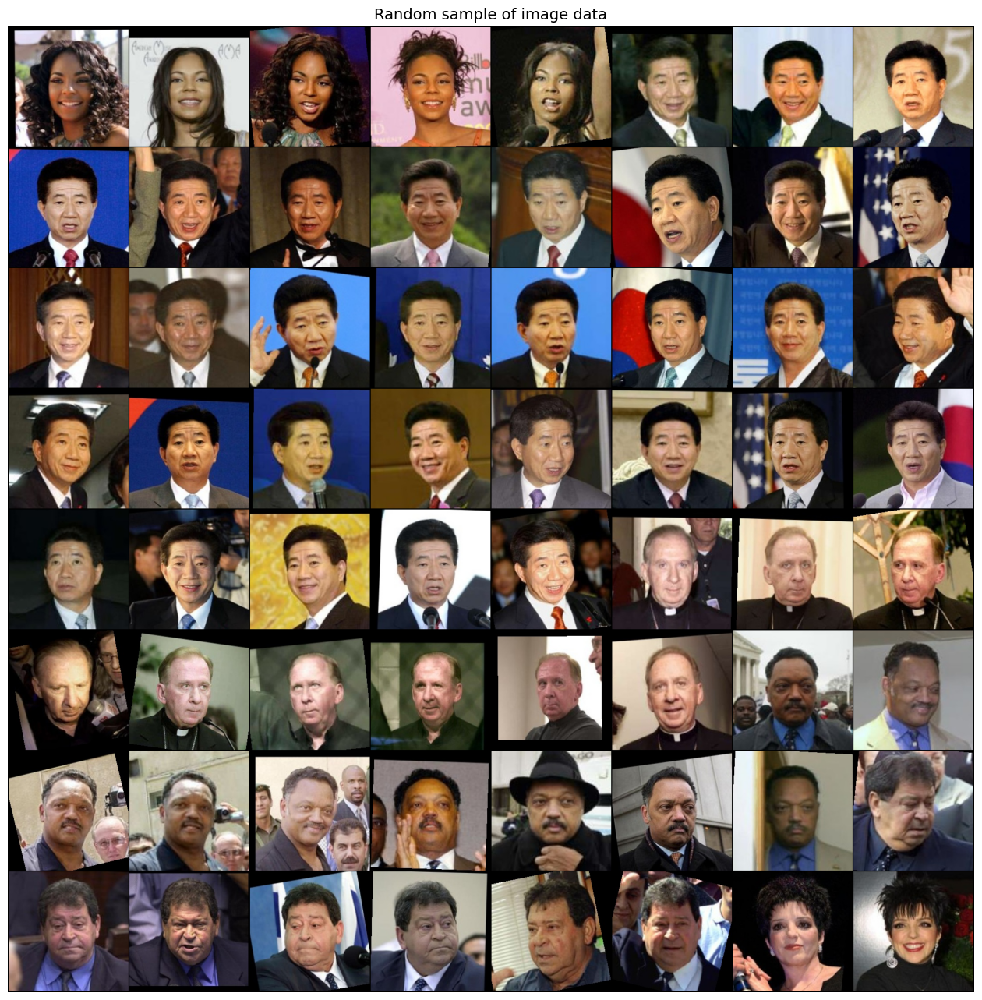

In [11]:
# Plot grid of iamages
images =  data[:64]
grid = make_grid(images)
grid = grid.permute(1,2,0)
    
fig, ax = plt.subplots(figsize=(16,32))
ax.imshow(grid)

ax.axis('off')
plt.title("Random sample of image data", fontsize=14)
plt.show()

# 2. Find pairs

In [12]:
# initialize empty start dictionary
pair_mapping = {}

# set index counter
counter = 0


for ind, p in enumerate(people):
    print(ind,p)
    pair_mapping[ind] = []

    # loop through every file in the directory and map the index of the files to the internal_counter
    # note: we skip the first file, because this is already the key of the mapping
    for file in os.listdir(p):
        
        pair_mapping[ind].append(counter)
        counter += 1
    print(pair_mapping)
    print(pair_mapping[ind])
    print('\n\n\n')

0 ../dataset/lfw_funneled/Ashanti/
{0: [0, 1, 2, 3, 4]}
[0, 1, 2, 3, 4]




1 ../dataset/lfw_funneled/Roh_Moo-hyun/
{0: [0, 1, 2, 3, 4], 1: [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]}
[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]




2 ../dataset/lfw_funneled/Thomas_OBrien/
{0: [0, 1, 2, 3, 4], 1: [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36], 2: [37, 38, 39, 40, 41, 42, 43, 44, 45]}
[37, 38, 39, 40, 41, 42, 43, 44, 45]




3 ../dataset/lfw_funneled/Jesse_Jackson/
{0: [0, 1, 2, 3, 4], 1: [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36], 2: [37, 38, 39, 40, 41, 42, 43, 44, 45], 3: [46, 47, 48, 49, 50, 51, 52, 53, 54]}
[46, 47, 48, 49, 50, 51, 52, 53, 54]




4 ../dataset/lfw_funne

In [13]:
len_of_samples = [len(xs) for xs in pair_mapping.values()]
print(len_of_samples)

[5, 32, 9, 9, 7, 7, 9, 53, 52, 9, 13, 5, 8, 5, 28, 5, 11, 21, 15, 15, 7, 5, 6, 30, 8, 16, 39, 26, 5, 6, 9, 5, 15, 5, 5, 5, 8, 9, 6, 5, 13, 29]


/home/davidalba/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


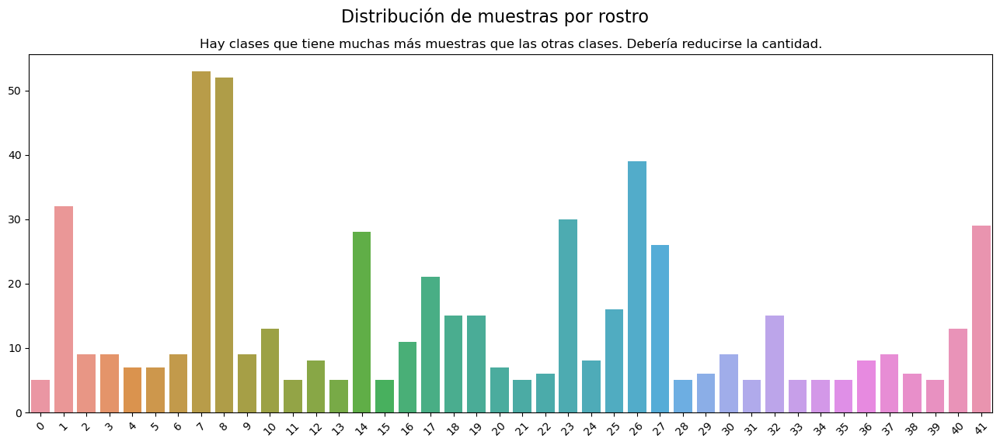

In [14]:
# Ajustar el tamaño de la figura para que sea más ancha
plt.figure(figsize=(16, 6))  # Aumentamos el ancho a 16 y dejamos la altura en 6

# Crear el gráfico de barras
sns.barplot(y=len_of_samples, x=list(pair_mapping.keys()))

# Agregar título principal y subtítulo
plt.suptitle("Distribución de muestras por rostro", fontsize=16)
plt.title("Hay clases que tiene muchas más muestras que las otras clases. Debería reducirse la cantidad.", fontsize=12)

# Si las etiquetas aún son largas, puedes rotarlas ligeramente
plt.xticks(rotation=45)  # Rotación ligera (45 grados)

# Mostrar el gráfico
plt.show()


In [15]:
# get average length of samples

means = [np.mean(len(xs)) for xs in pair_mapping.values()]
means_length = np.mean(means)
means_length

13.80952380952381

In [16]:
# #downsample class 3
# pair_mapping[18] = list(random.sample(pair_mapping[18] , int(means_length) + 6))
# pair_mapping[6] = list(random.sample(pair_mapping[6] , int(means_length) + 6))

In [17]:
print(f"There are {len(pair_mapping.keys())} unique faces!")

There are 42 unique faces!


In [18]:
# Create tuples of pairs 
positives = []
negatives = []

for key, indices in pair_mapping.items():
    print('key, indices:', key, indices)
    # find positive matches
    # set base face which is the face all the other gets mapped to 
    indices = list(indices)
    print('indices: ',indices)
    # find indices that are not matching
    other_indices = set(range(len_data)).difference(set(indices))
    print('other_indices: ', other_indices)
    # loop through the matching indices
    for i, index in enumerate(indices):
        print('i, index: ', i, index)
        # build pairs of matching indices but just in one direction, so we have no unnecessary double pairs
        # we want to avoid pairs like that: (1,2), (2,1) ....
        for subindex in indices[i + 1:]:
            # form a tuple with the matching face and add it to the list 
            positives.append((index, subindex))
            print('index, subindex: ',index, subindex)
        
        # loop through all the other indices and build matches with the current index
        for subindex in other_indices:
            negatives.append((index, subindex))
            print('index, subindex: ',index, subindex)
    print('\n\n\n')

key, indices: 0 [0, 1, 2, 3, 4]
indices:  [0, 1, 2, 3, 4]
other_indices:  {5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 

In [54]:
# ###########################################_______TEST_______#######################################
# for i1, i2 in zip([len(xs) for xs in pair_mapping.values()], [np.mean(len(xs)) for xs in pair_mapping.values()]):
#     print(f'{i1: ^10}, {i2: ^10}, {i1-i2: ^10}')
# # print([len(xs) for xs in pair_mapping.values()])
# # print([np.mean(len(xs)) for xs in pair_mapping.values()])

# print(positives)

print(negatives)

[(0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (0, 49), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 56), (0, 57), (0, 58), (0, 59), (0, 60), (0, 61), (0, 62), (0, 63), (0, 64), (0, 65), (0, 66), (0, 67), (0, 68), (0, 69), (0, 70), (0, 71), (0, 72), (0, 73), (0, 74), (0, 75), (0, 76), (0, 77), (0, 78), (0, 79), (0, 80), (0, 81), (0, 82), (0, 83), (0, 84), (0, 85), (0, 86), (0, 87), (0, 88), (0, 89), (0, 90), (0, 91), (0, 92), (0, 93), (0, 94), (0, 95), (0, 96), (0, 97), (0, 98), (0, 99), (0, 100), (0, 101), (0, 102), (0, 103), (0, 104), (0, 105), (0, 106), (0, 107), (0, 108), (0, 109), (0, 110), (0, 111), (0, 112), (0, 113), (0, 114),

In [19]:
print(f"We have {len(positives):,} matching pairs!")

print(f"We have {len(negatives):,} non matching pairs!")

We have 6,859 matching pairs!
We have 322,102 non matching pairs!


# 3.Create train and test data

In [20]:
# set train and test size
# remember we have many matching pairs!
import random
random.seed(1234)

train_size = 0.7 

# get train sample size
positive_train_sample = int(train_size * len(positives))
negative_train_sample = int(train_size * len(negatives))

# get random sample of all positives
train_positives = random.sample(positives, k=positive_train_sample)
train_negatives = random.sample(negatives, k=negative_train_sample)

# the rest are all test samples
test_positives = list(set(positives).difference(train_positives))
test_negatives = list(set(negatives).difference(train_negatives))

In [21]:
len(test_negatives) + len(train_negatives) == len(negatives)

True

# 4. Build train and test generator

In [22]:
# DATA BALANCE

positive_negative_ratio = len(negatives) / len(positives)
print(f"There are {positive_negative_ratio:.2f} more negative than positive samples!")

There are 46.96 more negative than positive samples!


/home/davidalba/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


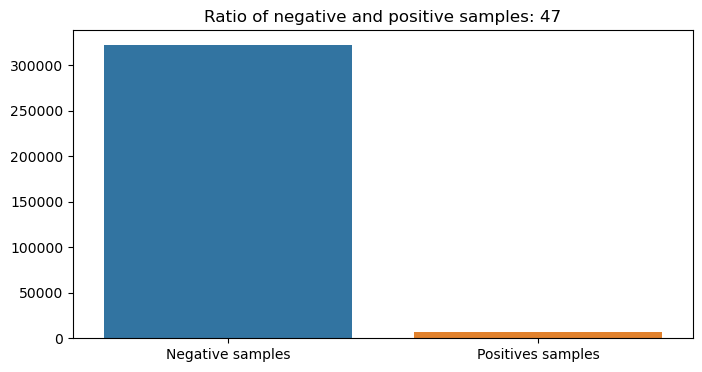

In [23]:
fig ,ax = plt.subplots(figsize=(8,4))
sns.barplot(y=[len(negatives), len(positives)], x = ["Negative samples", "Positives samples"], ax=ax)
plt.title("Ratio of negative and positive samples: %s" %round(positive_negative_ratio))
plt.show()

In [24]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device("cuda")
    
    return torch.device("cpu")

In [25]:
get_default_device()

device(type='cpu')

In [26]:
# Data augmentation
# Add custom transforms on top of needed transforms for the pretrained model

# get standard image means and stds
stats = ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

base_transforms = [
    tt.Resize((256,256), interpolation = tt.InterpolationMode.BICUBIC),
]

transforms_custom = tt.Compose([
    *base_transforms,
    tt.RandomCrop(250),
    tt.RandomHorizontalFlip(),
    tt.RandomRotation(30),
    tt.RandomVerticalFlip(),
    tt.Normalize(*stats)
])

test_transforms = tt.Compose([
    tt.Normalize(*stats)
])

In [27]:
# Remember: We have a highly imbalanced data set 


def train_generator(batch_size=64, prints=False):
    """
    Yields the batch for training the siamese network
    
    """
    n_batches = int(np.ceil(len(train_positives) / batch_size))
    device = get_default_device()
    
    
    random.shuffle(train_positives)
    X1 = torch.zeros((batch_size * 2,*img_shape)) 
    X2 = torch.zeros((batch_size * 2,*img_shape))
    y = torch.zeros((batch_size * 2))


    # loop through batches
    for i in range(n_batches): 
        if prints:
            print(i)
        pos_samples = train_positives[i * batch_size : batch_size * (i + 1)]
        neg_samples = np.random.choice(len(train_negatives), size=len(pos_samples))
        j = 0

        # get positive pairs and augment the image
        for x1, x2 in pos_samples:
            X1[j] = data[x1]
            X2[j] = data[x2]
            y[j] = 0
            j += 1

        # get negative pairs and augment the image
        for ind in neg_samples:
            X1[j] = data[train_negatives[ind][0]]
            X2[j] = data[train_negatives[ind][1]]
            y[j] = 1
            j += 1

        # move to gpu if possible
        X1 = transforms_custom(X1).to(device)[:j]
        X2 = transforms_custom(X2).to(device)[:j]
        y = y.to(device)[:j]

        yield (X1, X2), y


def test_generator(batch_size=64, prints=False):
    """
    Yields the batch for testing the siamese network
    
    """
    n_batches = int(np.ceil(len(test_positives) / batch_size))
    device = get_default_device()
    
    
    random.shuffle(train_positives)
    X1 = torch.zeros((batch_size * 2,*img_shape)) 
    X2 = torch.zeros((batch_size * 2,*img_shape))
    y = torch.zeros((batch_size * 2))
        

    # loop through batches
    for i in range(n_batches): 
        if prints:
            print(i)
        pos_samples = train_positives[i * batch_size : batch_size * (i + 1)]
        neg_samples = np.random.choice(len(train_negatives), size=len(pos_samples))
        j = 0

        # get positive pairs and augment the image
        for x1, x2 in pos_samples:
            X1[j] = data[x1]
            X2[j] = data[x2]
            y[j] = 0
            j += 1

        # get negative pairs and augment the image
        for ind in neg_samples:
            X1[j] = data[train_negatives[ind][0]]
            X2[j] = data[train_negatives[ind][1]]
            y[j] = 1
            j += 1

        # move to gpu if possible
        X1 = transforms_custom(X1).to(device)[:j]
        X2 = transforms_custom(X2).to(device)[:j]
        y = y.to(device)[:j]

        yield (X1, X2), y

In [28]:
print(f"Shape of train tensor: {next(train_generator(64,prints=True))[0][0].size()}")

0
Shape of train tensor: torch.Size([128, 3, 250, 250])


# 5. Build the model 

## Model description
- goal is to build a siamese network using a pretrained model as backbone
- backbone model will be either ResNet, EfficientNet or VGG

In [29]:
def compute_accuracy(distance,threshhold, true_labels):
    # all predictions that are below 0.75 are a match 
    y = true_labels.float()
    prediction = distance.to(torch.device("cpu")).detach().apply_(lambda x: 0 if x < threshhold else 1)
    return sum((prediction == y.to(torch.device("cpu")))) / len(true_labels)

In [ ]:
class SiameseNetwork(nn.Module):
    def __init__(self, train_backbone_params=True):
        super().__init__()
        self._train_backbone_params = train_backbone_params
        
        self.model = None
        #self._backbone = None
        
        self.loss = ContrastiveLoss()
        self._init_backbone()
        self._build_siamese()
        
    def _init_backbone(self):
        # Load a pre-trained ResNet-18 model from the torchvision library
        backbone = torchvision.models.resnet18(pretrained='vggface2')
        
        # Freeze or unfreeze the parameters of the backbone depending on the train_backbone_params argument
        if self._train_backbone_params:
            for param in backbone.parameters():
                param.requires_grad = True
        else:
            for param in backbone.parameters():
                param.requires_grad = False
        
        self._backbone = backbone
    
    def _build_siamese(self):
        # Replace the last fully-connected layer of the ResNet-18 model with a new one that outputs a feature vector of size 128
        self.model = self._backbone
        self.model.fc = nn.Sequential(
            nn.Linear(self._backbone.fc.in_features, 256),
            nn.ReLU(),
            nn.Linear(256, 128) # final feature vector
        )
        
    def forward_once(self, X):
        output = self.model(X)
        return output
    
    def forward(self, X1, X2):
        # Pass each input image through the model to obtain its feature vector
        output1 = self.forward_once(X1)
        output2 = self.forward_once(X2)
        distance = F.pairwise_distance(output1, output2)    
        return distance
    
    def training_step(self, batch, threshhold = 0.75):
        X, y = batch
        out = self(X[0], X[1]) 
        loss = self.loss(out, y) 
        acc = compute_accuracy(out, threshhold, y)
        
        return loss, acc
    
    def validation_step(self,batch, threshhold = 0.75):
        X, y = batch
        out = self(X[0],X[1]) 
        val_loss = self.loss(out, y)
        val_acc = compute_accuracy(out, threshhold, y)
        return {"val_loss": val_loss, "val_acc": val_acc}
    
    
    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_acc = [x["val_acc"] for x in outputs]

        epoch_loss = torch.stack(batch_losses).mean().item()
        epoch_acc = torch.stack(batch_acc).mean().item()
        return {"val_loss": epoch_loss, "val_acc": epoch_acc}
    
    def evaluate(self, dl):
        self.eval()
        with torch.no_grad():
            self.eval()
            outputs = [self.validation_step(batch) for batch in dl]
    
        return self.validation_epoch_end(outputs)
    
    def epoch_end_val(self, epoch, results):
        print(f"Epoch:[{epoch}]: validation loss: {results['val_loss']}, validation accuracy: {results['val_acc']}")

class ContrastiveLoss(nn.Module):
    def __init__(self, margin=1):
        super().__init__()
        self.margin = margin
    
    def forward(self, distance, labels):
        # Calculate the Euclidean distance between the two feature vectors
        y = labels.float()
        
        loss = torch.mean(torch.square(distance) * (1-y) + torch.square(torch.max(self.margin - distance, torch.zeros_like(distance))) * (y)) 
        return loss

In [ ]:
# training function
def fit(model, epochs, batch_size, train_generator, val_generator, optimizer, learning_rate, lr_scheduler,**kwargs):
    optimizer = optimizer(model.parameters(), lr=learning_rate)

    # set up learning rate scheduler if desired
    if lr_scheduler:
            lrs = lr_scheduler(optimizer, **kwargs)

    # set up list to log data of training
    history = []
    min_val_loss = float('inf')

    # set model to train mode to activate layers specific for training, such as the dropout layer
    model.train()
    for epoch in range(epochs):

    # set up list of metrics for epoch which are updated after each batch 
        train_losses = []
        train_acc = []
        for num, batch in enumerate(train_generator(batch_size)):
            lossF = ContrastiveLoss(margin=3)
            optimizer.zero_grad()
            print(f"New batch [{num}]")
            loss, acc= model.training_step(batch)
            loss.backward()
            optimizer.step()
            train_losses.append(loss.detach())
            train_acc.append(acc)
            print(f"Batch loss: {loss}")
            print(f"Batch accuracy: {acc}")
            # break for loop if num_batches is reached
            #if num > (int(np.ceil(len(train_positives) / batch_size)) - 1):
            #    break 

        result = model.evaluate(val_generator(batch_size))
        result["train_loss"] = torch.stack(train_losses).mean().item()
        result["train_acc"] = torch.stack(train_acc).mean().item()

        history.append(result)
       
        if lr_scheduler:
            lrs.step(metrics=result["val_loss"])
            print("Decreased!")
        

        model.epoch_end_val(epoch,result)
        print(f"Learning rate: {optimizer.param_groups[0]['lr']}")
        print(f"Train loss epoch: {result['train_loss']}")
        print(f"Train accuracy epoch: {result['train_acc']}")

        # save best model 
        if result["val_loss"] < min_val_loss:
            torch.save(model, 'best_model.pt')
            min_val_loss = result["val_loss"]

    return history

In [ ]:
# instantiate model
# get summary

device = get_default_device()
model = SiameseNetwork()
model = model.to(device)
print(torchinfo.summary(model))

# 6. Fit the model

In [ ]:
# fit the model using the predefined fit function
fit_it = True
if fit_it:
    torch.cuda.empty_cache() # empty lefover cuda cache 
    history = fit(model, 100, 128, train_generator, test_generator, torch.optim.Adam, 0.001,
                  torch.optim.lr_scheduler.ReduceLROnPlateau, patience=5, factor=0.05)
    torch.cuda.empty_cache() # empty cuda cache after training to prevent memory error

# 7. Evaluate

In [ ]:
# load model
# map to cpu for evaluation
model = torch.load("siamese-recognition/best_model.pt", map_location=torch.device("cpu"))

In [ ]:
#!pip install torchviz

In [ ]:
# # visualize computational graph
# from torchviz import make_dot
# x1 = torch.zeros(1, 3, 250, 250, dtype=torch.float, requires_grad=False).to(device)
# x2 = torch.zeros(1,3,250,250).to(device)

# lossF = ContrastiveLoss()
# out = model(x1,x2)
# make_dot(out)  # plot graph of variable, not of a nn.Module

In [ ]:
# evaluate the results
def check_prediction(ind1=None, ind2=None):
    if ind1 is None:
        ind1 = np.random.choice(len(data))
        ind2 = np.random.choice(len(data))  
    fig, (ax1, ax2) = plt.subplots(1,2)
    x1, x2 = data[ind1].to(torch.device("cpu")), data[ind2].to(torch.device("cpu"))
    ax1.imshow(x1.permute(1,2,0))
    ax2.imshow(x2.permute(1,2,0))
    ax1.axis("off")
    ax2.axis("off")
    
    pair = (ind1, ind2)
    
    if (pair in positives) or (pair[::-1] in positives):
        ax1.set_title("True label: Match!")
    else:
        ax1.set_title("True label: No match")
    
    distance = model(torch.unsqueeze(x1,0), torch.unsqueeze(x2,0))
    
    if distance < 0.75:
        ax2.set_title(f"Prediction: match with distance: {distance.item():.2f}")
    else:
        ax2.set_title(f"Prediction: no match with distance: {distance.item():.2f}")
    
    plt.show()
    
check_prediction(41,40)

In [ ]:
# calculate accuracy before training
# since the dataset is imbalanced, we'll report tp, tn, fp, fn
def get_train_accuracy(threshold=0.85):
    positive_distances = []
    negative_distances = []

    tp = 0
    tn = 0
    fp = 0
    fn = 0

    batch_size = 64
    
    X, y = next(train_generator())
    x1_positive = X[0][:batch_size].to(torch.device("cpu"))
    x2_positive = X[1][:batch_size].to(torch.device("cpu"))
    distances = model(x1_positive, x2_positive)
    positive_distances += distances.tolist()

    # update tp, tn, fp, fn
    tp += (distances < threshold).sum()

    x1_negative = X[0][batch_size:].to(torch.device("cpu"))
    x2_negative = X[1][batch_size:].to(torch.device("cpu"))
    distances = model(x1_negative, x2_negative)
    negative_distances += distances.tolist()

    # update tp, tn, fp, fn
    fp += (distances < threshold).sum()
    tn += (distances > threshold).sum()


    tpr = tp / (tp + fn)
    tnr = tn / (tn + fp)
    
    plt.hist(negative_distances, bins=20, density=True, label='negative_distances')
    plt.hist(positive_distances, bins=20, density=True, label='positive_distances')
    plt.suptitle("Train data evaluation")
    plt.title(f"sensitivity (tpr): {tpr}, specificity (tnr): {tnr}")
    plt.legend()
    plt.show()

def get_test_accuracy(threshold=0.85):
    positive_distances = []
    negative_distances = []

    tp = 0
    tn = 0
    fp = 0
    fn = 0

    batch_size = 64
    
    X, y = next(test_generator())
    x1_positive = X[0][:batch_size].to(torch.device("cpu"))
    x2_positive = X[1][:batch_size].to(torch.device("cpu"))
    distances = model(x1_positive, x2_positive)
    positive_distances += distances.tolist()

    # update tp, tn, fp, fn
    tp += (distances < threshold).sum()
    x1_negative = X[0][batch_size:].to(torch.device("cpu"))
    x2_negative = X[1][batch_size:].to(torch.device("cpu"))
    distances = model(x1_negative, x2_negative)
    negative_distances += distances.tolist()

    # update tp, tn, fp, fn
    fp += (distances < threshold).sum()
    tn += (distances > threshold).sum()


    tpr = tp / (tp + fn)
    tnr = tn / (tn + fp)
    
    plt.hist(negative_distances, bins=20, density=True, label='negative_distances')
    plt.hist(positive_distances, bins=20, density=True, label='positive_distances')
    plt.suptitle("Test data evaluation!")
    plt.title(f"sensitivity (tpr): {tpr}, specificity (tnr): {tnr}")
    plt.legend()
    plt.show()

In [ ]:
# visualize train accuracy
get_train_accuracy()

In [ ]:
# visualize test accuracy
get_test_accuracy()

In [ ]:
# evaluate the results
def inner_check_prediction(ind1=None, ind2=None):
    if ind1 is None:
        ind1 = np.random.choice(len(data))
        ind2 = np.random.choice(len(data))  
#     fig, (ax1, ax2) = plt.subplots(1,2)
    x1, x2 = data[ind1].to(torch.device("cpu")), data[ind2].to(torch.device("cpu"))
#     ax1.imshow(x1.permute(1,2,0))
#     ax2.imshow(x2.permute(1,2,0))
#     ax1.axis("off")
#     ax2.axis("off")
    
    pair = (ind1, ind2)
    check_prediction(ind1, ind2)
    if (pair in positives) or (pair[::-1] in positives):
#         ax1.set_title("True label: Match!")
        condition1 = 1
    else:
#         ax1.set_title("True label: No match")
        condition1 = 0
    
    distance = model(torch.unsqueeze(x1,0), torch.unsqueeze(x2,0))
    
    if distance < 0.75:
#         ax2.set_title(f"Prediction: match with distance: {distance.item():.2f}")
        condition2 = 1 
    else:
#         ax2.set_title(f"Prediction: no match with distance: {distance.item():.2f}")
        condition2 = 0
    
#     plt.show()
    print(f'index: ', pair)
    return 1 if (condition1 == condition2) else 0
    
inner_check_prediction(41,40)

In [ ]:
def calculate_accuracy(k=10, start_point=0):
    value = 0
    count = 0
    for i in range(k//2):
        value += inner_check_prediction(i,i+1)
        count += 1
        print(f'value: {value:^5} count: {count:^5}')
    for i in range(k//2,k):
        value += inner_check_prediction()
        count += 1
        print('value, count: ', value, count)
    return value/count

In [ ]:
value = calculate_accuracy(start_point=20, k=35)

In [ ]:
print('accuracy: ', value)